In [1]:
import math, cv2, numpy, torch
import torch.nn as nn

## **Yolov8**
Yolov8 bao gồm 3 phần: BackBone + Neck + Head

<center>
<img src="yolov8_architecture.png" width="700" height="700">

In [2]:
def yolo_params(version='n'):
    if version == 'n':
        return 1/3,1/4,2.0
    elif version == 's':
        return 1/3,1/2,2.0
    elif version == 'm':
        return 2/3,3/4,1.5
    elif version == 'l':
        return 1.0,1.0,1.0
    elif version == 'x':
        return 1.0,1.25,1.0

### **Backbone**
Backbone là mạng CSPDarknet53 với các khối Conv, C2f, SPPF
1. **Conv**: Conv2d + BatchNorm2d + SiLU 
2. **C2f**: Conv + Bottlenecks + Conv (tổng hợp thông tin ở nhiều cấp độ)
3. **SPPF (spatial pyramid pooling fast)**: Conv + Maxpool2d + Conv (tổng hợp thông tin từ các scale khác nhau)

In [3]:
class Conv(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size=3, stride=1, padding=1, groups=1, activation=True):
        super().__init__()

        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, groups=groups, bias=False)
        self.bn = nn.BatchNorm2d(num_features=out_channels, eps=0.001, momentum=0.03)
        self.act = nn.SiLU(inplace=True) if activation else nn.Identity()

    def forward(self, x):
        return self.act(self.bn(self.conv(x)))
    

class Bottleneck(nn.Module):
    def __init__(self, in_channels, out_channels, shortcut=True):
        super().__init__()

        self.conv1 = Conv(in_channels, out_channels)
        self.conv2 = Conv(out_channels, out_channels)
        self.shortcut = shortcut

    def forward(self, x):
        if self.shortcut:
            return x + self.conv2(self.conv1(x))
        
        return self.conv2(self.conv1(x))
    
class C2f(nn.Module):
    def __init__(self, in_channels, out_channels, n_bottlenecks, shortcut=True):
        super().__init__()
        self.mid_channels = out_channels // 2
        self.shortcut = shortcut

        self.conv1 = Conv(in_channels, out_channels, kernel_size=1, padding=0)
        self.m = nn.ModuleList([Bottleneck(self.mid_channels, self.mid_channels, shortcut) for i in range(n_bottlenecks)])
        self.conv2 = Conv(self.mid_channels*(n_bottlenecks + 2), out_channels, kernel_size=1, padding=0)

    def forward(self, x):
        x = self.conv1(x)
        #split
        output_list = list(x.chunk(2, 1))

        for bottleneck in self.m:
            output_list.append(bottleneck(output_list[-1]))

        output = torch.cat(output_list, dim=1) #concat channel

        return self.conv2(output)

class SPPF(nn.Module):
    def __init__(self, in_channels, out_channels, pooling_kernel_size=5):
        super().__init__()
        mid_channels = in_channels // 2

        self.conv1 = Conv(in_channels, mid_channels, kernel_size=1, stride=1, padding=0)
        self.pooling = nn.MaxPool2d(kernel_size=pooling_kernel_size, stride=1, padding=2)
        self.conv2 = Conv(4*mid_channels, out_channels, kernel_size=1, stride=1, padding=0)

    def forward(self, x):
        x1 = self.conv1(x)

        x2 = self.pooling(x1)
        x3 = self.pooling(x2)
        x4 = self.pooling(x3)

        x = torch.cat([x1, x2, x3, x4], dim=1)
        
        return self.conv2(x)

In [4]:
class Backbone(nn.Module):
    def __init__(self, in_channels=3, version='n'):
        super().__init__()
        d, w, r = yolo_params(version)

        self.p1 = nn.Sequential(Conv(in_channels, round(64*w), 3, 2, 1))
        self.p2 = nn.Sequential(Conv(round(64*w), round(128*w), 3, 2, 1),
                                C2f(round(128*w), round(128*w), round(3*d), True))
        # stride 8
        self.p3 = nn.Sequential(Conv(round(128*w), round(256*w), 3, 2, 1),
                                C2f(round(256*w), round(256*w), round(6*d), True))
        # stride 16
        self.p4 = nn.Sequential(Conv(round(256*w), round(512*w), 3, 2, 1),
                                C2f(round(512*w), round(512*w), round(6*d), True))
        # stride 32
        self.p5 = nn.Sequential(Conv(round(512*w), round(512*w*r), 3, 2, 1),
                                C2f(round(512*w*r), round(512*w*r), round(3*d), True),
                                SPPF(round(512*w*r), round(512*w*r)))
        
    def forward(self, x):
        p1 = self.p1(x)
        p2 = self.p2(p1)
        p3 = self.p3(p2)
        p4 = self.p4(p3)
        p5 = self.p5(p4)

        return p3, p4,p5


### **Neck**
Bao gồm các lớp Upsample + C2f

**Upsample**: Sử dụng nội suy láng giềng gần nhất (nearest-neighbor interpolation) với scale_factor=2

<center>
<img src="upsampling.png" width="500" height="300">

In [5]:
class Neck(nn.Module):
    def __init__(self, version='n'):
        super().__init__()
        d, w, r = yolo_params(version)

        self.up = nn.Upsample(scale_factor=2.0, mode='nearest')
        self.c2f1 = C2f(round(512*w*(1+r)), round(512*w), round(3*d), False)
        self.c2f2 = C2f(round(768*w), round(256*w), round(3*d), False)
        self.conv1 = Conv(round(256*w), round(256*w), 3, 2, 1)
        self.c2f3 = C2f(round(768*w), round(512*w), round(3*d), False)
        self.conv2 = Conv(round(512*w), round(512*w), 3, 2, 1)
        self.c2f4 = C2f(round(512*w*(1+r)), round(512*w*r), round(3*d), False)

    def forward(self, x):
        p3, p4, p5 = x

        p4 = self.c2f1(torch.cat(tensors=[self.up(p5), p4], dim=1))
        p3 = self.c2f2(torch.cat(tensors=[self.up(p4), p3], dim=1))
        p4 = self.c2f3(torch.cat(tensors=[self.conv1(p3), p4], dim=1))
        p5 = self.c2f4(torch.cat(tensors=[self.conv2(p4), p5], dim=1))

        return p3, p4, p5

### **Head**
Gồm 3 module: Tương quan bouding box, phân loại lớp, distribution focal loss (DFL)

DFL dùng để học phân phối xác suất khoảng cách từ anchor đến các cạnh của bbox dựa. Trong giai đoạn suy luận, các khoảng cách từ anchor đến cạnh của bbox $(left, top, right, bottom)$ sẽ được xác định giựa trên phân phối này. Ví dụ, dự đoán khoảng cách từ tâm đến cạnh bên trái ($l$) được chuẩn hóa trong khoảng $[0,1]$, ta làm như sau:

- DLF chia khoảng $[0,1]$ thành 16 phần bằng nhau
- Mô hình sẽ có tương ứng 16 đầu ra tương ứng với nhiệm vụ dự đoán xác suất mà $l$ rơi vào: $(p_0,p_1,...,p_{14},p_{15})$
- Dự đoán giá trị: $l$ = $\sum_{i=0}^{15} \frac{i}{16} \cdot p_i$

In [6]:
# x.shape = (3, batch_size, 4*reg_max + nc, h, w), stride = [8, 16, 32]
# get anchor coordinates (x, y) = coordinates of center of each cell of grid wxh
def make_anchors(x, strides, offset=0.5):
    anchor_tensor, stride_tensor = [], []
    dtype, device = x[0].dtype, x[0].device
    for i, stride in enumerate(strides):
        _, _, h, w = x[i].shape
        sx = torch.arange(end=w, device=device, dtype=dtype) + offset  # x coordinates of anchor centers
        sy = torch.arange(end=h, device=device, dtype=dtype) + offset  # y coordinates of anchor centers

        # create all (x, y)
        sy, sx = torch.meshgrid(sy, sx, indexing='ij')
        anchor_tensor.append(torch.stack((sx, sy), -1).view(-1, 2))

        stride_tensor.append(torch.full((h * w, 1), stride, dtype=dtype, device=device))
        
    return torch.cat(anchor_tensor), torch.cat(stride_tensor)

In [7]:
class DFL(nn.Module):
    def __init__(self, reg_max=16):
        super().__init__()
        self.reg_max = reg_max
        
        self.conv = nn.Conv2d(in_channels=reg_max, out_channels=1, kernel_size=1,stride=1, bias=False)
        init_params = torch.arange(16, dtype=torch.float).view(1, 16, 1, 1)
        self.conv.weight.data[:] = nn.Parameter(init_params)

    def forward(self, x):
        b, c, a = x.shape
        x = x.view(b, 4, self.reg_max, a).transpose(1, 2)

        # take softmax on channel dimension to get distribution probabilities
        x=x.softmax(1)                          # [b,reg_max,4,a]
        x=self.conv(x)                          # [b,1,4,a]

        return x.view(b,4,a)                    # [b,4,a]

class Head(nn.Module):
    def __init__(self, nc, version='n'):
        super().__init__()
        d, w, r = yolo_params(version)
        # input_channels p3, p4, p5
        input_channels = [round(256*w), round(512*w), round(512*w*r)]

        self.nc = nc    # num class
        self.nl = 3     # num detect layer
        self.reg_max = 16   # DFL channels (input_channels[0] // 16 to scale 4/8/12/16/20 for n/s/m/l/x)
        self.no = nc + self.reg_max * 4     # number of outputs per anchor
        self.stride = torch.zeros(self.nl)      # strides computed during build

        box_channels = max((16, input_channels[0] // 4, self.reg_max * 4))
        cls_channel = max(input_channels[0], min(self.nc, 100))

        self.box = nn.ModuleList(nn.Sequential(Conv(in_channels=in_channels, out_channels=box_channels),
                                               Conv(in_channels=box_channels, out_channels=box_channels),
                                               nn.Conv2d(box_channels, self.reg_max*4, 1))
                                               for in_channels in input_channels)
        self.cls = nn.ModuleList(nn.Sequential(Conv(in_channels=in_channels, out_channels=cls_channel),
                                               Conv(in_channels=cls_channel, out_channels=cls_channel),
                                               nn.Conv2d(cls_channel, self.nc, 1))
                                               for in_channels in input_channels)
        
        self.dfl = DFL(self.reg_max)
        
    def forward(self, x):
        for i in range(len(self.box)):          # detection head i
            box = self.box[i](x[i])             # [bs,num_coordinates,h,w]
            cls = self.cls[i](x[i])             # [bs,num_classes,h,w]
            x[i] = torch.cat([box, cls], dim=1) # [bs,num_coordinates+num_classes,h,w]

        # in training, no dfl output
        if self.training:
            return x                         # [3,bs,num_coordinates+num_classes,h,w]
        
        # inference,
        anchors, strides = (i.transpose(0, 1) for i in make_anchors(x, self.stride))
        # flatten 2d wxh to 1d and concat 3 layer detect
        x = torch.cat([i.view(x[0].shape[0], self.no, -1) for i in x], dim=2)
        # split predicted for bbox and cls
        box, cls = x.split(split_size=(4 * self.reg_max, self.nc), dim=1)

        a, b = self.dfl(box).chunk(2, 1)
        # compute conner coordinates
        a = anchors.unsqueeze(0) - a # top left corner
        b = anchors.unsqueeze(0) + b # bottom right corner
        # compute center coordinates and w, h => (x, y, w, h)
        box = torch.cat(tensors=((a + b) / 2, b - a), dim=1)

        return torch.cat(tensors=(box * strides, cls.sigmoid()), dim=1)

    def initialize_biases(self):
        # Initialize biases
        # WARNING: requires stride availability
        for box, cls, s in zip(self.box, self.cls, self.stride):
            # box
            box[-1].bias.data[:] = 1.0
            cls[-1].bias.data[:self.nc] = math.log(5 / self.nc / (640 / s) ** 2)
  

### **Model**

In [8]:
class YOLOv8(nn.Module):
    def __init__(self, nc, version='n'):
        super().__init__()
        self.backbone = Backbone(in_channels=3, version=version)
        self.neck = Neck(version=version)
        self.head = Head(nc=nc, version=version)

        img_dumpy = torch.zeros(1, 3, 256, 256)
        self.head.stride= torch.Tensor([256 / x.shape[-2] for x in self.forward(img_dumpy)])
        self.head.initialize_biases()

    def forward(self, x):
        x = self.backbone(x)
        x = list(self.neck(x))
        x = self.head(x)
        return x

In [9]:
x = torch.rand((2,3,640,640))
model_check = YOLOv8(nc=8, version='n')

print('Backbone')
x = model_check.backbone(x)
p3, p4, p5 = x
print(p3.shape)
print(p4.shape)
print(p5.shape)

print('Neck')
p3, p4, p5 = model_check.neck(x)
print(p3.shape)
print(p4.shape)
print(p5.shape)

Backbone
torch.Size([2, 64, 80, 80])
torch.Size([2, 128, 40, 40])
torch.Size([2, 256, 20, 20])
Neck
torch.Size([2, 64, 80, 80])
torch.Size([2, 128, 40, 40])
torch.Size([2, 256, 20, 20])


In [10]:
outputs = model_check.head([p3, p4,p5])
print(outputs[0].shape)
print(outputs[1].shape)
print(outputs[2].shape)

torch.Size([2, 72, 80, 80])
torch.Size([2, 72, 40, 40])
torch.Size([2, 72, 20, 20])


In [11]:
model_check.eval()
outputs = model_check.head([p3, p4,p5])
print(outputs.shape)

torch.Size([2, 12, 8400])


## **Data Loader**
- Bộ dữ liệu sử dụng được tạo từ bộ dữ liệu vietnamese vehicles - Bộ dữ liệu xe phổ biến của Việt Nam tại thời điểm khác nhau trong ngày ở TP.HCM (~39k imgs)
    - Bộ small: 10k chia thành 3 tập train:dev:test=0.65:0.15:0.2
    - Bộ medium: 20k chia thành 3 tập train:dev:test=0.65:0.15:0.2

- 1 mẫu gồm 2 file:
    - .jpg: file ảnh
    - .txt: gồm các dòng, mỗi dòng là bộ 5 tham số (c: nhãn lớp, x: tâm x, y: tâm y, w: độ rộng, h: độ cao)<br>
    x, y, w, h  là tỉ lệ so với kích thước ảnh<br>
    tọa độ tâm (anchor_x, anchor_y) trên ảnh = (x\*img_width, y\*img_height)


In [12]:
import os
import warnings
import tqdm
import yaml
from PIL import Image
from torch.utils import data


warnings.filterwarnings("ignore")
FORMATS = 'bmp', 'dng', 'jpeg', 'jpg', 'mpo', 'png', 'tif', 'tiff', 'webp'

In [13]:
class Dataset(data.Dataset):
    def __init__(self, filenames, input_size):
        self.input_size = input_size

        # Read labels
        labels = self.load_label(filenames)
        self.labels = list(labels.values())
        self.filenames = list(labels.keys())  # update
        self.n = len(self.filenames)  # number of samples
        self.indices = range(self.n)

    def __getitem__(self, index):
        index = self.indices[index]
        
        # Load image
        image, shape = self.load_image(index)
        pre_h, pre_w = image.shape[:2]

        # Resize
        image, pad = self.resize(image, self.input_size)

        nl = len(self.labels[index])  # number of labels
        cls = self.labels[index][:, 0:1]
        box = self.labels[index][:, 1:5]
        box = self.box_fit_new_size(box, pre_w, pre_h, pad[0], pad[1])

        target_cls = torch.zeros((nl, 1))
        target_box = torch.zeros((nl, 4))
        if nl:
            target_cls = torch.from_numpy(cls)
            target_box = torch.from_numpy(box)

        # Convert HxWxC to CxHxW, BGR to RGB
        sample = image.transpose((2, 0, 1))[::-1]
        sample = numpy.ascontiguousarray(sample)

        return torch.from_numpy(sample), target_cls, target_box, torch.zeros(nl)

    def __len__(self):
        return len(self.filenames)

    def load_image(self, i):
        image = cv2.imread(self.filenames[i])
        h, w = image.shape[:2]
        r = self.input_size / max(h, w)
        if r != 1:
            image = cv2.resize(image, dsize=(int(w * r), int(h * r)), interpolation=cv2.INTER_LINEAR)
        return image, (h, w)
    
    def box_fit_new_size(self, x, old_w, old_h, pad_w=0, pad_h=0):
        t = numpy.copy(x)
        t[:, 0] = old_w * (x[:, 0] - x[:, 2] / 2) + pad_w  # top left x
        t[:, 1] = old_h * (x[:, 1] - x[:, 3] / 2) + pad_h  # top left y
        t[:, 2] = old_w * (x[:, 0] + x[:, 2] / 2) + pad_w  # bottom right x
        t[:, 3] = old_h * (x[:, 1] + x[:, 3] / 2) + pad_h  # bottom right y

        y = numpy.copy(t)
        w = old_w + 2*pad_w
        h = old_h + 2*pad_h
        y[:, 0] = ((t[:, 0] + t[:, 2]) / 2) / w  # x center
        y[:, 1] = ((t[:, 1] + t[:, 3]) / 2) / h  # y center
        y[:, 2] = (t[:, 2] - t[:, 0]) / w  # width
        y[:, 3] = (t[:, 3] - t[:, 1]) / h  # height
        return y

    def resize(self, image, input_size):
        # Resize and pad image while meeting stride-multiple constraints
        shape = image.shape[:2]  # current shape [height, width]

        # Scale ratio (new / old)
        r = min(input_size / shape[0], input_size / shape[1], 1.0)

        # Compute padding
        pad = int(round(shape[1] * r)), int(round(shape[0] * r))
        w = (input_size - pad[0]) / 2
        h = (input_size - pad[1]) / 2

        if shape[::-1] != pad:  # resize
            image = cv2.resize(image, dsize=pad, interpolation=cv2.INTER_LINEAR)
        top, bottom = int(round(h - 0.1)), int(round(h + 0.1))
        left, right = int(round(w - 0.1)), int(round(w + 0.1))
        image = cv2.copyMakeBorder(image, top, bottom, left, right, cv2.BORDER_CONSTANT)  # add border

        return image, (w, h)

    @staticmethod
    def collate_fn(batch):
        samples, cls, box, indices = zip(*batch)

        cls = torch.cat(cls, dim=0)
        box = torch.cat(box, dim=0)

        new_indices = list(indices)
        for i in range(len(indices)):
            new_indices[i] += i
        indices = torch.cat(new_indices, dim=0)

        targets = {'cls': cls,
                   'box': box,
                   'idx': indices}
        return torch.stack(samples, dim=0), targets

    @staticmethod
    def load_label(filenames):
        path = f'{os.path.dirname(filenames[0])}.cache'
        if os.path.exists(path):
            return torch.load(path)
        x = {}
        for filename in filenames:
            try:
                # verify images
                with open(filename, 'rb') as f:
                    image = Image.open(f)
                    image.verify()  # PIL verify
                shape = image.size  # image size
                assert (shape[0] > 9) & (shape[1] > 9), f'image size {shape} <10 pixels'
                assert image.format.lower() in FORMATS, f'invalid image format {image.format}'

                # verify labels
                if os.path.isfile(filename.rsplit('.', 1)[0] + '.txt'):
                    with open(filename.rsplit('.', 1)[0] + '.txt') as f:
                        label = [x.split() for x in f.read().strip().splitlines() if len(x)]
                        label = numpy.array(label, dtype=numpy.float32)
                    nl = len(label)
                    if nl:
                        assert (label >= 0).all()
                        assert label.shape[1] == 5
                        assert (label[:, 1:] <= 1).all()
                        _, i = numpy.unique(label, axis=0, return_index=True)
                        if len(i) < nl:  # duplicate row check
                            label = label[i]  # remove duplicates
                    else:
                        label = numpy.zeros((0, 5), dtype=numpy.float32)
                else:
                    label = numpy.zeros((0, 5), dtype=numpy.float32)
            except FileNotFoundError:
                label = numpy.zeros((0, 5), dtype=numpy.float32)
            except AssertionError:
                continue
            x[filename] = label
        torch.save(x, path)
        return x


In [14]:
# get all file names
data_dir= './datasets/dataset_small'
data_m_dir= './datasets/dataset_medium'
filenames_train = [f'{data_m_dir}/train/' + f for f in os.listdir(f'{data_m_dir}/train') if f.endswith('.jpg')]
filenames_val = [f'{data_m_dir}/val/' + f for f in os.listdir(f'{data_m_dir}/val') if f.endswith('.jpg')]
filenames_test = [f'{data_m_dir}/test/' + f for f in os.listdir(f'{data_m_dir}/test') if f.endswith('.jpg')]

# input_size for the model
input_size=640

# get params from yaml file
with open('vehicle.yaml', errors='ignore') as f:
        params = yaml.safe_load(f)

batch_size = 16
train_data = Dataset(filenames_train, input_size)
train_loader = data.DataLoader(train_data, batch_size, shuffle=True, num_workers=0, pin_memory=True, collate_fn=Dataset.collate_fn)

val_data = Dataset(filenames_val, input_size)
val_loader = data.DataLoader(val_data, batch_size, shuffle=False, num_workers=0, pin_memory=True, collate_fn=Dataset.collate_fn)

test_data = Dataset(filenames_test, input_size)
test_loader = data.DataLoader(test_data, batch_size, shuffle=True, num_workers=0, pin_memory=True, collate_fn=Dataset.collate_fn)

In [15]:
batch=next(iter(val_loader))
print("All keys in batch      : ", batch[1].keys())
print(f"Input batch shape      : ", batch[0].shape)
print(f"Classification scores  : {batch[1]['cls'].shape}")
print(f"Box coordinates        : {batch[1]['box'].shape}")
print(f"Index identifier (which score belongs to which image): {batch[1]['idx'].shape}")

All keys in batch      :  dict_keys(['cls', 'box', 'idx'])
Input batch shape      :  torch.Size([16, 3, 640, 640])
Classification scores  : torch.Size([182, 1])
Box coordinates        : torch.Size([182, 4])
Index identifier (which score belongs to which image): torch.Size([182])


In [16]:
def info(dataset:Dataset):
    cls_count = numpy.zeros(params['nc'], dtype=numpy.int64)
    target_boxs = numpy.zeros((0, 4))
    for i in range(dataset.n):
        target_cls = dataset.labels[i][:, 0].astype(numpy.int64)
        target_boxs = numpy.concatenate((target_boxs, dataset.labels[i][:, 1:]), axis=0)
        cls, count = numpy.unique(target_cls, return_counts=True)
        cls_count[cls] += count

    return {'cls_count': cls_count, 'target_boxs': target_boxs}

In [17]:
train_info = info(train_data)
val_info = info(val_data)
test_info = info(test_data)

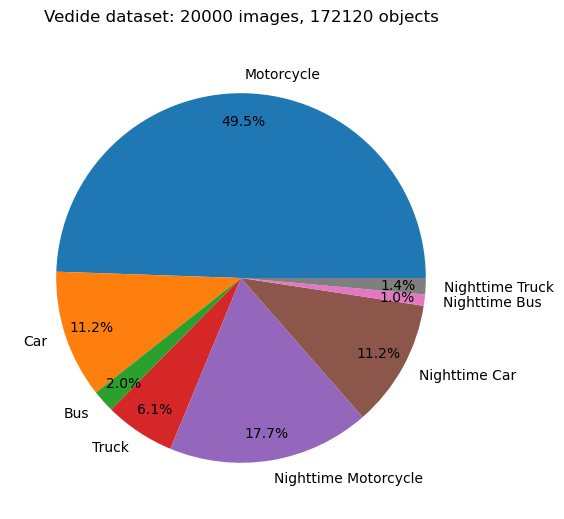

In [18]:
import matplotlib.pyplot as plt

cls_count = train_info['cls_count'] + val_info['cls_count'] + test_info['cls_count']

plt.figure(figsize=(6, 6))
plt.pie(cls_count, labels=list(params['names'].values()), autopct='%1.1f%%', pctdistance=0.85)
plt.title(f'Vedide dataset: {train_data.n + val_data.n + test_data.n} images, {cls_count.sum()} objects\n', loc='center')
plt.show()

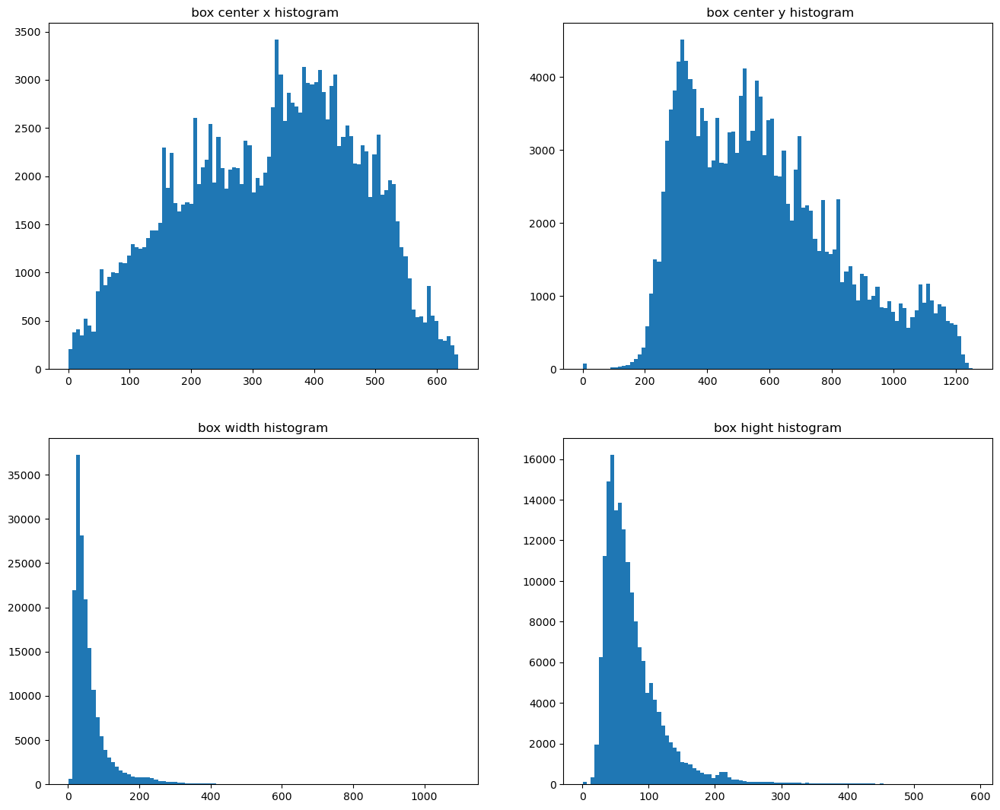

In [19]:
plt.figure(figsize=(16, 13))

image = cv2.imread(filenames_test[0])
h_size, w_size = image.shape[:2]
x = numpy.concatenate((train_info['target_boxs'][:, 0], val_info['target_boxs'][:, 0], test_info['target_boxs'][:, 0]), axis=0)
y = numpy.concatenate((train_info['target_boxs'][:, 1], val_info['target_boxs'][:, 1], test_info['target_boxs'][:, 1]), axis=0)
w = numpy.concatenate((train_info['target_boxs'][:, 2], val_info['target_boxs'][:, 2], test_info['target_boxs'][:, 2]), axis=0)
h = numpy.concatenate((train_info['target_boxs'][:, 3], val_info['target_boxs'][:, 3], test_info['target_boxs'][:, 3]), axis=0)

plt.subplot(2, 2, 1)
plt.hist(x * input_size, bins=100)
plt.title(" box center x histogram")

plt.subplot(2, 2, 2)
plt.hist(y * w_size, bins=100)
plt.title(" box center y histogram")

plt.subplot(2, 2, 3)
plt.hist(w * w_size, bins=100)
plt.title("box width histogram")

plt.subplot(2, 2, 4)
plt.hist(h * h_size, bins=100)
plt.title("box hight histogram")

plt.show()

## **Train & Eval**

In [20]:
import cv2
import csv
from platform import system

# set multiprocess start method as `fork` to speed up the training
if system() != 'Windows':
    torch.multiprocessing.set_start_method('fork', force=True)

# disable opencv multithreading to avoid system being overloaded
cv2.setNumThreads(0)

# setup OMP threads
if 'OMP_NUM_THREADS' not in os.environ:
    os.environ['OMP_NUM_THREADS'] = '1'

# setup MKL threads
if 'MKL_NUM_THREADS' not in os.environ:
    os.environ['MKL_NUM_THREADS'] = '1'

### **Eval Function**

In [21]:
from time import time
import torchvision

In [89]:
def wh2xy(x):
    y = x.clone() if isinstance(x, torch.Tensor) else numpy.copy(x)
    y[:, 0] = x[:, 0] - x[:, 2] / 2  # top left x
    y[:, 1] = x[:, 1] - x[:, 3] / 2  # top left y
    y[:, 2] = x[:, 0] + x[:, 2] / 2  # bottom right x
    y[:, 3] = x[:, 1] + x[:, 3] / 2  # bottom right y
    return y

# predict and label for each image
def compute_metric(output, target, iou_v):
    # intersection(N,M) = (rb(N,M,2) - lt(N,M,2)).clamp(0).prod(2)
    (a1, a2) = target[:, 1:].unsqueeze(1).chunk(2, 2)
    (b1, b2) = output[:, :4].unsqueeze(0).chunk(2, 2)
    intersection = (torch.min(a2, b2) - torch.max(a1, b1)).clamp(0).prod(2)
    # IoU = intersection / (area1 + area2 - intersection)
    iou = intersection / ((a2 - a1).prod(2) + (b2 - b1).prod(2) - intersection + 1e-7)

    correct = numpy.zeros((output.shape[0], iou_v.shape[0]))
    correct = correct.astype(bool)
    for i in range(len(iou_v)):
        # IoU > threshold and classes match
        x = torch.where((iou >= iou_v[i]) & (target[:, 0:1] == output[:, 5]))
        if x[0].shape[0]:
            matches = torch.cat((torch.stack(x, 1),
                                 iou[x[0], x[1]][:, None]), 1).cpu().numpy()  # [label, detect, iou]
            if x[0].shape[0] > 1:
                matches = matches[matches[:, 2].argsort()[::-1]]
                matches = matches[numpy.unique(matches[:, 1], return_index=True)[1]]
                matches = matches[numpy.unique(matches[:, 0], return_index=True)[1]]
            correct[matches[:, 1].astype(int), i] = True
    return torch.tensor(correct, dtype=torch.bool, device=output.device)


def non_max_suppression(outputs, confidence_threshold=0.001, iou_threshold=0.7):
    max_wh = 7680
    max_det = 300
    max_nms = 30000

    bs = outputs.shape[0]  # batch size
    nc = outputs.shape[1] - 4  # number of classes
    xc = outputs[:, 4:4 + nc].amax(1) > confidence_threshold  # candidates

    # Settings
    output = [torch.zeros((0, 6), device=outputs.device)] * bs
    for index, x in enumerate(outputs):  # image index, image inference
        x = x.transpose(0, -1)[xc[index]]  # confidence - (n_cells, 4 + nc)

        # If none remain process next image
        if not x.shape[0]:
            continue

        # matrix nx6 (coordinates box, confidence, cls) for each box
        box, cls = x.split((4, nc), 1)
        box = wh2xy(box)  # (cx, cy, w, h) to conner coordinates (x1, y1, x2, y2)
        # i, j = (cls > confidence_threshold).nonzero(as_tuple=False).T
        # x = torch.cat((box[i], x[i, 4 + j, None], j[:, None].float()), 1)
        conf, j = cls.max(1, keepdim=True)
        x = torch.cat((box, conf, j.float()), 1)[conf.view(-1) > confidence_threshold]

        # xi = (x1,y1,x2,y2,confidence,cls)
        # Check shape
        n = x.shape[0]  # number of boxes
        if not n:  # no boxes
            continue
        x = x[x[:, 4].argsort(descending=True)[:max_nms]]  # sort by confidence and remove excess boxes

        # Batched NMS
        # separate box coordinates of each class
        # avoid the situation that two bboxes belonging to different categories are highly overlapping
        c = x[:, 5:6] * max_wh 
        boxes = x[:, :4] + c  # boxes
        scores = x[:, 4]
        indices = torchvision.ops.nms(boxes, scores, iou_threshold)  # NMS
        indices = indices[:max_det]  # limit detections

        output[index] = x[indices]

    return output


def smooth(y, f=0.1):
    # Box filter of fraction f
    nf = round(len(y) * f * 2) // 2 + 1  # number of filter elements (must be odd)
    p = numpy.ones(nf // 2)  # ones padding
    yp = numpy.concatenate((p * y[0], y, p * y[-1]), 0)  # y padded
    return numpy.convolve(yp, numpy.ones(nf) / nf, mode='valid')  # y-smoothed


def compute_ap(tp, conf, output, target, names=(), eps=1E-16):
    # Sort by object-ness
    i = numpy.argsort(-conf)
    tp, conf, output = tp[i], conf[i], output[i]

    # Find unique classes
    unique_classes, nt = numpy.unique(target, return_counts=True)
    nc = unique_classes.shape[0]  # number of classes, number of detections

    # Create Precision-Recall curve and compute AP for each class
    p = numpy.zeros((nc, 1000))
    r = numpy.zeros((nc, 1000))
    ap = numpy.zeros((nc, tp.shape[1]))
    px, py = numpy.linspace(start=0, stop=1, num=1000), []  # for plotting
    for ci, c in enumerate(unique_classes):
        i = output == c
        nl = nt[ci]  # number of labels
        no = i.sum()  # number of outputs
        if no == 0 or nl == 0:
            continue

        # Accumulate FPs and TPs
        fpc = (1 - tp[i]).cumsum(0)
        tpc = tp[i].cumsum(0) # cumulative sum

        # Recall
        recall = tpc / (nl + eps)  # recall curve
        # negative x, xp because xp decreases
        r[ci] = numpy.interp(-px, -conf[i], recall[:, 0], left=0)

        # Precision
        precision = tpc / (tpc + fpc)  # precision curve
        p[ci] = numpy.interp(-px, -conf[i], precision[:, 0], left=1)  # p at pr_score

        # AP from recall-precision curve
        for j in range(tp.shape[1]):
            m_rec = numpy.concatenate(([0.0], recall[:, j], [1.0]))
            m_pre = numpy.concatenate(([1.0], precision[:, j], [0.0]))

            # Compute the precision envelope
            m_pre = numpy.flip(numpy.maximum.accumulate(numpy.flip(m_pre)))

            # Integrate area under curve
            x = numpy.linspace(start=0, stop=1, num=101)  # 101-point interp (COCO)
            ap[ci, j] = numpy.trapz(numpy.interp(x, m_rec, m_pre), x)  # integrate
            
    # Compute F1 (harmonic mean of precision and recall)
    f1 = 2 * p * r / (p + r + eps)

    i = smooth(f1.mean(0), 0.1).argmax()  # max F1 index
    p, r, f1 = p[:, i], r[:, i], f1[:, i]
    cls_ap = ap
    ap50, ap = ap[:, 0], ap.mean(1)  # AP@0.5, AP@0.5:0.95
    m_pre, m_rec = p.mean(), r.mean()
    map50, mean_ap = ap50.mean(), ap.mean()
    return cls_ap, p, r, m_pre, m_rec, map50, mean_ap


In [90]:
def eval(loader:data.DataLoader, model=None):
    model.half()
    model.eval()

    # Configure
    iou_v = torch.linspace(start=0.5, end=0.95, steps=10).cuda()  # iou vector for mAP@0.5:0.95
    n_iou = iou_v.numel()

    m_pre = 0
    m_rec = 0
    map50 = 0
    mean_ap = 0
    metrics = []
    p_bar = tqdm.tqdm(loader, desc=('%10s' * 5) % ('', 'precision', 'recall', 'mAP50', 'mAP'))
    for samples, targets in p_bar:
        samples = samples.cuda()
        samples = samples.half()  # uint8 to fp16/32
        samples = samples / 255.  # 0 - 255 to 0.0 - 1.0
        _, _, h, w = samples.shape  # batch-size, channels, height, width
        scale = torch.tensor((w, h, w, h)).cuda()
        # Inference
        with torch.no_grad():
            outputs = model(samples) # (x, y, w, h, [p_nc])
        # NMS
        outputs = non_max_suppression(outputs, confidence_threshold=0.05)
        # Metrics
        for i, output in enumerate(outputs):
            idx = targets['idx'] == i
            cls = targets['cls'][idx]
            box = targets['box'][idx]

            cls = cls.cuda()
            box = box.cuda()

            metric = torch.zeros(output.shape[0], n_iou, dtype=torch.bool).cuda()

            if output.shape[0] == 0:
                if cls.shape[0]:
                    metrics.append((metric, *torch.zeros((2, 0)).cuda(), cls.squeeze(-1)))
                continue
            # Evaluate
            if cls.shape[0]:
                target = torch.cat(tensors=(cls, wh2xy(box) * scale), dim=1)
                metric = compute_metric(output[:, :6], target, iou_v)
            # Append
            metrics.append((metric, output[:, 4], output[:, 5], cls.squeeze(-1)))

    # Compute metrics
    metrics = [torch.cat(x, dim=0).cpu().numpy() for x in zip(*metrics)]  # to numpy
    if len(metrics) and metrics[0].any():
        cls_ap, p, r, m_pre, m_rec, map50, mean_ap = compute_ap(*metrics, names=params["names"])
    # Print results
    print(('%10s' + '%10.4g' * 4) % ('', m_pre, m_rec, map50, mean_ap))
    # Return results
    model.float()  # for training
    return cls_ap, p, r, mean_ap, map50, m_rec, m_pre


### **Loss Funtion**

In [99]:
from torch.nn.functional import cross_entropy

In [95]:
# compute CIoU
def compute_iou(box1, box2, eps=1e-7):
    # Returns Intersection over Union (IoU) of box1(1,4) to box2(n,4)

    # Get the coordinates of bounding boxes
    b1_x1, b1_y1, b1_x2, b1_y2 = box1.chunk(4, -1)
    b2_x1, b2_y1, b2_x2, b2_y2 = box2.chunk(4, -1)
    w1, h1 = b1_x2 - b1_x1, b1_y2 - b1_y1 + eps
    w2, h2 = b2_x2 - b2_x1, b2_y2 - b2_y1 + eps

    # Intersection area
    inter = (b1_x2.minimum(b2_x2) - b1_x1.maximum(b2_x1)).clamp(0) * \
            (b1_y2.minimum(b2_y2) - b1_y1.maximum(b2_y1)).clamp(0)

    # Union Area
    union = w1 * h1 + w2 * h2 - inter + eps

    # IoU
    iou = inter / union
    cw = b1_x2.maximum(b2_x2) - b1_x1.minimum(b2_x1)  # convex (smallest enclosing box) width
    ch = b1_y2.maximum(b2_y2) - b1_y1.minimum(b2_y1)  # convex height
    c2 = cw ** 2 + ch ** 2 + eps  # convex diagonal squared
    rho2 = ((b2_x1 + b2_x2 - b1_x1 - b1_x2) ** 2 + (b2_y1 + b2_y2 - b1_y1 - b1_y2) ** 2) / 4  # center dist ** 2
    v = (4 / math.pi ** 2) * (torch.atan(w2 / h2) - torch.atan(w1 / h1)).pow(2)
    with torch.no_grad():
        alpha = v / (v - iou + (1 + eps))
    return iou - (rho2 / c2 + v * alpha)  # CIoU


def df_loss(pred_dist, target):
    # Distribution Focal Loss (DFL)
    tl = target.long()  # target left
    tr = tl + 1  # target right
    wl = tr - target  # weight left
    wr = 1 - wl  # weight right
    left_loss = cross_entropy(pred_dist, tl.view(-1), reduction='none').view(tl.shape)
    right_loss = cross_entropy(pred_dist, tr.view(-1), reduction='none').view(tl.shape)
    return (left_loss * wl + right_loss * wr).mean(-1, keepdim=True)

In [380]:
# TaskAlignedAssigner
# task-aligned metric t = Classification_Score^alpha x IoU_Score^beta
# eps: A small value to prevent division by zero.

# Assign ground trust object (ground trust box and label) for 8400 cell preicted
# With each ground trust object, choose top k cells preicted has alignment metric score highest
# each cell only is assigned one ground trust object
# if one cell is assigned more than one object, 
# that cell is assigned with object which iou score with that cell highest
# the cell, which is not assigned a ground trust object, is background

class Assigner(torch.nn.Module):
    def __init__(self, nc=8, top_k=10, alpha=0.5, beta=6.0, eps=1E-9):
        super().__init__()
        self.top_k = top_k
        self.nc = nc
        self.alpha = alpha
        self.beta = beta
        self.eps = eps

    @torch.no_grad()
    def forward(self, pd_scores, pd_bboxes, anc_points, gt_labels, gt_bboxes, mask_gt):
        batch_size = pd_scores.size(0)
        num_max_boxes = gt_bboxes.size(1)

        if num_max_boxes == 0:
            device = gt_bboxes.device
            return (torch.zeros_like(pd_bboxes).to(device),
                    torch.zeros_like(pd_scores).to(device),
                    torch.zeros_like(pd_scores[..., 0]).to(device))

        num_anchors = anc_points.shape[0]
        shape = gt_bboxes.shape
        lt, rb = gt_bboxes.view(-1, 1, 4).chunk(2, 2)
        #[batch_size, num_max_boxes, num_anchors, 2]
        # each ground trust box, mask anchors (8400 anchors) in it
        mask_in_gts = torch.cat((anc_points[None] - lt, rb - anc_points[None]), dim=2)
        mask_in_gts = mask_in_gts.view(shape[0], shape[1], num_anchors, -1).amin(3).gt_(self.eps)
        na = pd_bboxes.shape[-2]
        gt_mask = (mask_in_gts * mask_gt).bool()  # b, max_num_obj, h*w
        overlaps = torch.zeros([batch_size, num_max_boxes, na], dtype=pd_bboxes.dtype, device=pd_bboxes.device)
        bbox_scores = torch.zeros([batch_size, num_max_boxes, na], dtype=pd_scores.dtype, device=pd_scores.device)

        # compute confident score for each label object with each predicted label(8400 cell)
        ind = torch.zeros([2, batch_size, num_max_boxes], dtype=torch.long)  # 2, b, max_num_obj
        ind[0] = torch.arange(end=batch_size).view(-1, 1).expand(-1, num_max_boxes)  # b, max_num_obj
        ind[1] = gt_labels.squeeze(-1)  # b, max_num_obj
        bbox_scores[gt_mask] = pd_scores[ind[0], :, ind[1]][gt_mask]  # b, max_num_obj, h*w

        # compute iou for each target box with each predicted box(8400 cell)
        pd_boxes = pd_bboxes.unsqueeze(1).expand(-1, num_max_boxes, -1, -1)[gt_mask]
        gt_boxes = gt_bboxes.unsqueeze(2).expand(-1, -1, na, -1)[gt_mask]
        overlaps[gt_mask] = compute_iou(gt_boxes, pd_boxes).squeeze(-1).clamp_(0)

        # compute alignment metric for each target box with each predicted box(8400 cell)
        align_metric = bbox_scores.pow(self.alpha) * overlaps.pow(self.beta)

        # Get top k predicted box for each target is positive samples
        top_k_mask = mask_gt.expand(-1, -1, self.top_k).bool()
        top_k_metrics, top_k_indices = torch.topk(align_metric, self.top_k, dim=-1, largest=True)

        if top_k_mask is None:
            top_k_mask = (top_k_metrics.max(-1, keepdim=True)[0] > self.eps).expand_as(top_k_indices)
        top_k_indices.masked_fill_(~top_k_mask, 0)

        mask_top_k = torch.zeros(align_metric.shape, dtype=torch.int8, device=top_k_indices.device)
        ones = torch.ones_like(top_k_indices[:, :, :1], dtype=torch.int8, device=top_k_indices.device)
        for k in range(self.top_k):
            mask_top_k.scatter_add_(-1, top_k_indices[:, :, k:k + 1], ones)
        mask_top_k.masked_fill_(mask_top_k > 1, 0)
        mask_top_k = mask_top_k.to(align_metric.dtype)
        mask_pos = mask_top_k * mask_in_gts * mask_gt

        # check one cell is assigned only one object
        # if one cell is assigned more than one object, 
        # that cell is assigned with object which iou score with that cell highest
        fg_mask = mask_pos.sum(-2)
        if fg_mask.max() > 1:
            mask_multi_gts = (fg_mask.unsqueeze(1) > 1).expand(-1, num_max_boxes, -1)

            max_overlaps_idx = overlaps.argmax(1)
            is_max_overlaps = torch.zeros(mask_pos.shape, dtype=mask_pos.dtype, device=mask_pos.device)
            is_max_overlaps.scatter_(1, max_overlaps_idx.unsqueeze(1), 1)

            mask_pos = torch.where(mask_multi_gts, is_max_overlaps, mask_pos).float()
            fg_mask = mask_pos.sum(-2)
        target_gt_idx = mask_pos.argmax(-2)

        # Assigned target
        index = torch.arange(end=batch_size, dtype=torch.int64, device=gt_labels.device)[..., None]
        target_index = target_gt_idx + index * num_max_boxes
        target_labels = gt_labels.long().flatten()[target_index]

        target_bboxes = gt_bboxes.view(-1, gt_bboxes.shape[-1])[target_index]

        # Assigned target scores
        target_labels.clamp_(0)

        target_scores = torch.zeros((target_labels.shape[0], target_labels.shape[1], self.nc),
                                    dtype=torch.int64,
                                    device=target_labels.device)
        target_scores.scatter_(2, target_labels.unsqueeze(-1), 1)

        fg_scores_mask = fg_mask[:, :, None].repeat(1, 1, self.nc)
        target_scores = torch.where(fg_scores_mask > 0, target_scores, 0)
        print(target_scores[target_scores.sum(-1)>1])

        # Normalize
        align_metric *= mask_pos
        pos_align_metrics = align_metric.amax(dim=-1, keepdim=True)
        pos_overlaps = (overlaps * mask_pos).amax(dim=-1, keepdim=True)
        norm_align_metric = (align_metric * pos_overlaps / (pos_align_metrics + self.eps)).amax(-2).unsqueeze(-1)
        target_scores = target_scores * norm_align_metric

        return target_bboxes, target_scores, fg_mask.bool()

class BoxLoss(torch.nn.Module):
    def __init__(self, dfl_ch):
        super().__init__()
        self.dfl_ch = dfl_ch

    def forward(self, pred_dist, pred_bboxes, anchor_points, target_bboxes, target_scores, target_scores_sum, fg_mask):
        # IoU loss
        weight = torch.masked_select(target_scores.sum(-1), fg_mask).unsqueeze(-1)
        iou = compute_iou(pred_bboxes[fg_mask], target_bboxes[fg_mask])
        loss_box = ((1.0 - iou) * weight).sum() / target_scores_sum

        # DFL loss
        a, b = target_bboxes.chunk(2, -1)
        target = torch.cat((anchor_points - a, b - anchor_points), -1)
        target = target.clamp(0, self.dfl_ch - 0.01)
        loss_dfl = df_loss(pred_dist[fg_mask].view(-1, self.dfl_ch + 1), target[fg_mask])
        loss_dfl = (loss_dfl * weight).sum() / target_scores_sum

        return loss_box, loss_dfl

class ComputeLoss:
    def __init__(self, model, params):
        device = next(model.parameters()).device

        m = model.head  # Head() module

        self.params = params
        self.stride = m.stride
        self.nc = m.nc
        self.no = m.no
        self.reg_max = m.reg_max
        self.device = device

        self.assigner = Assigner(self.nc)
        self.box_loss = BoxLoss(self.reg_max - 1).to(device)
        self.cls_loss = torch.nn.BCEWithLogitsLoss(reduction='none')

        self.project = torch.arange(self.reg_max, dtype=torch.float, device=device)

    def box_decode(self, anchor_points, pred_dist):
        b, a, c = pred_dist.shape
        pred_dist = pred_dist.view(b, a, 4, c // 4)
        pred_dist = pred_dist.softmax(3)
        pred_dist = pred_dist.matmul(self.project.type(pred_dist.dtype))
        lt, rb = pred_dist.chunk(2, -1)
        x1y1 = anchor_points - lt
        x2y2 = anchor_points + rb
        return torch.cat(tensors=(x1y1, x2y2), dim=-1)

    # outputs: (3, batch_size, reg_max*4 + nc, h, w)
    def __call__(self, outputs, targets):
        x = torch.cat([i.view(outputs[0].shape[0], self.no, -1) for i in outputs], dim=2)
        boxes, scores = x.split(split_size=(self.reg_max * 4, self.nc), dim=1)

        boxes = boxes.permute(0, 2, 1).contiguous()     # (batch_size, n_cells, reg_max * 4)
        scores = scores.permute(0, 2, 1).contiguous()   # (batch_size, n_cells, nc)

        data_type = scores.dtype
        batch_size = scores.shape[0]
        input_size = torch.tensor(outputs[0].shape[2:], device=self.device, dtype=data_type) * self.stride[0]
        anchor_points, stride_tensor = make_anchors(outputs, self.stride, offset=0.5)

        idx = targets['idx'].view(-1, 1)
        cls = targets['cls'].view(-1, 1)
        box = targets['box']
        targets = torch.cat(tensors=(idx, cls, box), dim=1).to(self.device)
        if targets.shape[0] == 0:
            gt = torch.zeros(batch_size, 0, 5, device=self.device)
        else:
            i = targets[:, 0]
            _, counts = i.unique(return_counts=True)
            counts = counts.to(dtype=torch.int32)
            gt = torch.zeros(batch_size, counts.max(), 5, device=self.device)
            for j in range(batch_size):
                matches = i == j
                n = matches.sum()
                if n:
                    gt[j, :n] = targets[matches, 1:]

            # convert target (cx, cy, w, h) to (t-l_x, t-l_y, b-r_x, b-r_y)
            # because yolov8 predict top left conner and bottom right conner coordinates
            x = gt[..., 1:5].mul_(input_size[[1, 0, 1, 0]])
            y = torch.empty_like(x)
            dw = x[..., 2] / 2  # half-width
            dh = x[..., 3] / 2  # half-height
            y[..., 0] = x[..., 0] - dw  # top left x
            y[..., 1] = x[..., 1] - dh  # top left y
            y[..., 2] = x[..., 0] + dw  # bottom right x
            y[..., 3] = x[..., 1] + dh  # bottom right y
            gt[..., 1:5] = y

        target_labels, target_bboxes = gt.split(split_size=(1, 4), dim=2)
        target_mask = target_bboxes.sum(2, keepdim=True).gt_(0) # mask bbox of each image (image has bbox <= gt.shape[1])

        decoded_boxes = self.box_decode(anchor_points, boxes)
        assigned_targets = self.assigner(scores.detach().sigmoid(),
                                         (decoded_boxes.detach() * stride_tensor).type(target_bboxes.dtype),
                                         anchor_points * stride_tensor, target_labels, target_bboxes, target_mask)
        target_bboxes, target_scores, fg_mask = assigned_targets

        print(target_bboxes.shape)
        print((target_scores[target_scores.sum(-1)>0]>0).sum(1, keepdim=True))
        print(fg_mask.shape)

        target_scores_sum = max(target_scores.sum(), 1)

        loss_cls = self.cls_loss(scores, target_scores.to(data_type)).sum() / target_scores_sum  # BCE

        # Box loss
        loss_box = torch.zeros(1, device=self.device)
        loss_dfl = torch.zeros(1, device=self.device)
        if fg_mask.sum():
            target_bboxes /= stride_tensor
            loss_box, loss_dfl = self.box_loss(boxes,
                                               decoded_boxes,
                                               anchor_points,
                                               target_bboxes,
                                               target_scores,
                                               target_scores_sum, fg_mask)

        loss_box *= self.params['box']  # box gain
        loss_cls *= self.params['cls']  # cls gain
        loss_dfl *= self.params['dfl']  # dfl gain

        return loss_box, loss_cls, loss_dfl


### **Train**

In [ ]:
def set_params(model, decay):
    p1 = []
    p2 = []
    norm = tuple(v for k, v in torch.nn.__dict__.items() if "Norm" in k)
    for m in model.modules():
        for n, p in m.named_parameters(recurse=0):
            if not p.requires_grad:
                continue
            if n == "bias":  # bias (no decay)
                p1.append(p)
            elif n == "weight" and isinstance(m, norm):  # norm-weight (no decay)
                p1.append(p)
            else:
                p2.append(p)  # weight (with decay)
    return [{'params': p1, 'weight_decay': 0.00},
            {'params': p2, 'weight_decay': decay}]

class LinearLR:
    def __init__(self, epochs, params, num_steps):
        max_lr = params['max_lr']
        min_lr = params['min_lr']

        warmup_steps = int(max(params['warmup_epochs'] * num_steps, 100))
        decay_steps = int(epochs * num_steps - warmup_steps)

        warmup_lr = numpy.linspace(min_lr, max_lr, int(warmup_steps), endpoint=False)
        decay_lr = numpy.linspace(max_lr, min_lr, decay_steps)

        self.total_lr = numpy.concatenate((warmup_lr, decay_lr))

    def step(self, step, optimizer):
        for param_group in optimizer.param_groups:
            param_group['lr'] = self.total_lr[step]

class AverageMeter:
    def __init__(self):
        self.num = 0
        self.sum = 0
        self.avg = 0

    def update(self, v, n):
        if not math.isnan(float(v)):
            self.num = self.num + n
            self.sum = self.sum + v * n
            self.avg = self.sum / self.num

In [407]:
# Model
# model = YOLOv8(nc=params['nc'], version='n')
saved = torch.load(f='./weights/last.pt', weights_only=False)
model = saved['model']
model.cuda()

YOLOv8(
  (backbone): Backbone(
    (p1): Sequential(
      (0): Conv(
        (conv): Conv2d(3, 16, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(16, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
    )
    (p2): Sequential(
      (0): Conv(
        (conv): Conv2d(16, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
        (act): SiLU(inplace=True)
      )
      (1): C2f(
        (conv1): Conv(
          (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn): BatchNorm2d(32, eps=0.001, momentum=0.03, affine=True, track_running_stats=True)
          (act): SiLU(inplace=True)
        )
        (m): ModuleList(
          (0): Bottleneck(
            (conv1): Conv(
              (conv): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1

In [21]:
epochs = 30

In [22]:
# Optimizer
optimizer = torch.optim.SGD(set_params(model, params['weight_decay']),
                            params['min_lr'], params['momentum'], nesterov=True)


# Scheduler
num_steps = len(train_loader)
scheduler = LinearLR(epochs, params, num_steps)


best = 0
step = 0
amp_scale = torch.amp.GradScaler('cuda')
criterion = ComputeLoss(model, params)

with open('weights/step.csv', 'w') as log:

    logger = csv.DictWriter(log, fieldnames=['epoch', 'box', 'cls', 'dfl',
                                            'Recall', 'Precision', 'mAP@50', 'mAP'])
    logger.writeheader()

    for epoch in range(epochs):
        model.train()
        
        p_bar = train_loader

        print(('\n' + '%10s' * 5) % ('epoch', 'memory', 'box', 'cls', 'dfl'))
        p_bar = tqdm.tqdm(p_bar, total=num_steps)

        optimizer.zero_grad()
        avg_box_loss = AverageMeter()
        avg_cls_loss = AverageMeter()
        avg_dfl_loss = AverageMeter()

        for samples, targets in p_bar:

            scheduler.step(step, optimizer)

            samples = samples.cuda().float() / 255

            # Forward
            with torch.amp.autocast('cuda'):
                outputs = model(samples)  # forward
                loss_box, loss_cls, loss_dfl = criterion(outputs, targets)

            avg_box_loss.update(loss_box.item(), samples.size(0))
            avg_cls_loss.update(loss_cls.item(), samples.size(0))
            avg_dfl_loss.update(loss_dfl.item(), samples.size(0))

            loss_box *= batch_size  # loss scaled by batch_size
            loss_cls *= batch_size  # loss scaled by batch_size
            loss_dfl *= batch_size  # loss scaled by batch_size

            # Backward
            amp_scale.scale(loss_box + loss_cls + loss_dfl).backward()

            # Optimize
            amp_scale.step(optimizer)  # optimizer.step
            amp_scale.update()
            optimizer.zero_grad()

            # Log
            memory = f'{torch.cuda.memory_reserved() / 1E9:.4g}G'  # (GB)
            s = ('%10s' * 2 + '%10.3g' * 3) % (f'{epoch + 1}/{epochs}', memory,
                                            avg_box_loss.avg, avg_cls_loss.avg, avg_dfl_loss.avg)
            p_bar.set_description(s)

            step += 1


        # mAP
        last = eval(val_loader, model)

        logger.writerow({'epoch': str(epoch + 1).zfill(3),
                            'box': str(f'{avg_box_loss.avg:.3f}'),
                            'cls': str(f'{avg_cls_loss.avg:.3f}'),
                            'dfl': str(f'{avg_dfl_loss.avg:.3f}'),
                            'mAP': str(f'{last[0]:.3f}'),
                            'mAP@50': str(f'{last[1]:.3f}'),
                            'Recall': str(f'{last[2]:.3f}'),
                            'Precision': str(f'{last[3]:.3f}')})
        log.flush()

        # Update best mAP
        if last[0] > best:
            best = last[0]

        # Save model
        save = {'epoch': epoch + 1,
                'step': step,
                'model': model}

        # Save last, best and delete
        torch.save(save, f='./weights/last.pt')
        if best == last[0]:
            torch.save(save, f='./weights/best.pt')
        del save

#train time: 4h


     epoch    memory       box       cls       dfl


           precision    recall     mAP50       mAP: 100%|██████████| 94/94 [01:16<00:00,  1.23it/s]


              0.6016    0.5985    0.6179    0.3731

     epoch    memory       box       cls       dfl


           precision    recall     mAP50       mAP: 100%|██████████| 94/94 [00:50<00:00,  1.87it/s]


              0.6166    0.5675    0.6006     0.352

     epoch    memory       box       cls       dfl


           precision    recall     mAP50       mAP: 100%|██████████| 94/94 [00:51<00:00,  1.83it/s]


              0.6423    0.6092    0.6457    0.3923

     epoch    memory       box       cls       dfl


           precision    recall     mAP50       mAP: 100%|██████████| 94/94 [00:53<00:00,  1.74it/s]


              0.6718    0.6729    0.6979    0.4341

     epoch    memory       box       cls       dfl


           precision    recall     mAP50       mAP: 100%|██████████| 94/94 [00:51<00:00,  1.82it/s]


              0.7164    0.7025    0.7338    0.4694

     epoch    memory       box       cls       dfl


           precision    recall     mAP50       mAP: 100%|██████████| 94/94 [00:51<00:00,  1.84it/s]


              0.7179    0.6772    0.7383    0.4869

     epoch    memory       box       cls       dfl


           precision    recall     mAP50       mAP: 100%|██████████| 94/94 [00:51<00:00,  1.81it/s]


              0.7642    0.7312    0.7906    0.5353

     epoch    memory       box       cls       dfl


           precision    recall     mAP50       mAP: 100%|██████████| 94/94 [00:51<00:00,  1.83it/s]


              0.7514    0.7375    0.7712    0.5216

     epoch    memory       box       cls       dfl


           precision    recall     mAP50       mAP: 100%|██████████| 94/94 [00:51<00:00,  1.81it/s]


              0.7874     0.741    0.8069    0.5521

     epoch    memory       box       cls       dfl


           precision    recall     mAP50       mAP: 100%|██████████| 94/94 [00:51<00:00,  1.83it/s]


              0.7381    0.7573    0.7981    0.5551

     epoch    memory       box       cls       dfl


           precision    recall     mAP50       mAP: 100%|██████████| 94/94 [00:50<00:00,  1.85it/s]


               0.813    0.7348    0.8206    0.5784

     epoch    memory       box       cls       dfl


           precision    recall     mAP50       mAP: 100%|██████████| 94/94 [00:49<00:00,  1.88it/s]


              0.8091    0.7493    0.8194    0.5751

     epoch    memory       box       cls       dfl


           precision    recall     mAP50       mAP: 100%|██████████| 94/94 [00:50<00:00,  1.85it/s]


               0.796    0.7728     0.829    0.5843

     epoch    memory       box       cls       dfl


           precision    recall     mAP50       mAP: 100%|██████████| 94/94 [00:51<00:00,  1.82it/s]


              0.7786    0.7813    0.8197    0.5747

     epoch    memory       box       cls       dfl


           precision    recall     mAP50       mAP: 100%|██████████| 94/94 [00:51<00:00,  1.81it/s]


              0.8037    0.7746    0.8322    0.5883

     epoch    memory       box       cls       dfl


           precision    recall     mAP50       mAP: 100%|██████████| 94/94 [00:51<00:00,  1.81it/s]


              0.8058    0.7861    0.8354    0.5941

     epoch    memory       box       cls       dfl


           precision    recall     mAP50       mAP: 100%|██████████| 94/94 [00:51<00:00,  1.82it/s]


              0.8229    0.7787    0.8378    0.5937

     epoch    memory       box       cls       dfl


           precision    recall     mAP50       mAP: 100%|██████████| 94/94 [00:51<00:00,  1.83it/s]


              0.8167    0.7915    0.8435    0.6014

     epoch    memory       box       cls       dfl


           precision    recall     mAP50       mAP: 100%|██████████| 94/94 [00:52<00:00,  1.80it/s]


                0.85    0.7733    0.8517    0.6061

     epoch    memory       box       cls       dfl


           precision    recall     mAP50       mAP: 100%|██████████| 94/94 [00:51<00:00,  1.82it/s]


              0.8425    0.7782    0.8538    0.6076

     epoch    memory       box       cls       dfl


           precision    recall     mAP50       mAP: 100%|██████████| 94/94 [00:49<00:00,  1.89it/s]


               0.822    0.8134    0.8514    0.6137

     epoch    memory       box       cls       dfl


           precision    recall     mAP50       mAP: 100%|██████████| 94/94 [00:51<00:00,  1.82it/s]


              0.8132    0.8026    0.8428    0.6018

     epoch    memory       box       cls       dfl


           precision    recall     mAP50       mAP: 100%|██████████| 94/94 [00:51<00:00,  1.82it/s]


              0.8353    0.7827    0.8466    0.6074

     epoch    memory       box       cls       dfl


           precision    recall     mAP50       mAP: 100%|██████████| 94/94 [00:50<00:00,  1.85it/s]


              0.8473    0.7922     0.849    0.6149

     epoch    memory       box       cls       dfl


           precision    recall     mAP50       mAP: 100%|██████████| 94/94 [00:52<00:00,  1.79it/s]


              0.8195    0.8047    0.8501      0.61

     epoch    memory       box       cls       dfl


           precision    recall     mAP50       mAP: 100%|██████████| 94/94 [00:51<00:00,  1.82it/s]


              0.8091    0.8094    0.8483    0.6095

     epoch    memory       box       cls       dfl


           precision    recall     mAP50       mAP: 100%|██████████| 94/94 [00:50<00:00,  1.88it/s]


              0.8426     0.786    0.8557     0.616

     epoch    memory       box       cls       dfl


           precision    recall     mAP50       mAP: 100%|██████████| 94/94 [00:52<00:00,  1.78it/s]


              0.8257    0.8043    0.8554    0.6208

     epoch    memory       box       cls       dfl


           precision    recall     mAP50       mAP: 100%|██████████| 94/94 [01:19<00:00,  1.19it/s]


               0.819    0.8081    0.8528    0.6177

     epoch    memory       box       cls       dfl


           precision    recall     mAP50       mAP: 100%|██████████| 94/94 [00:59<00:00,  1.57it/s]

              0.8336    0.7971    0.8512    0.6174


In [414]:
import pandas as pd
import matplotlib.pyplot as plt

train_log = pd.read_csv('weights/train_medium/step_50.csv')
train_log[:3]

,epoch,box,cls,dfl,Recall,Precision,mAP@50,mAP
0,1,2.835,3.341,2.002,0.111,0.174,0.024,0.008
1,2,1.911,1.574,1.227,0.327,0.355,0.268,0.108
2,3,1.606,1.146,1.101,0.284,0.360,0.257,0.130


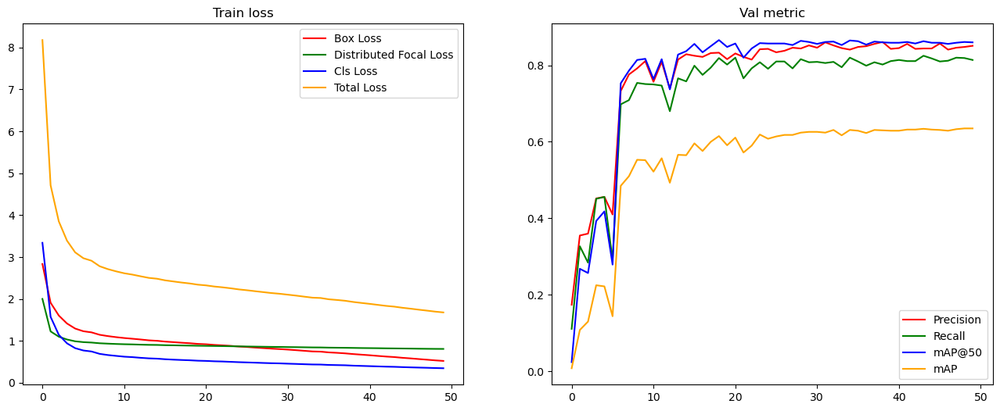

In [426]:
plt.figure(figsize=(16, 6))

plt.subplot(1, 2, 1)
plt.plot(train_log['box'], "r", label="Box Loss")
plt.plot(train_log['dfl'], "g", label="Distributed Focal Loss")
plt.plot(train_log['cls'], "b", label="Cls Loss")
plt.plot(train_log['box'] + train_log['cls'] + train_log['dfl'], "orange", label="Total Loss")
plt.legend()
plt.title('Train loss')

plt.subplot(1, 2, 2)
plt.plot(train_log['Precision'], "r", label="Precision")
plt.plot(train_log['Recall'], "g", label="Recall")
plt.plot(train_log['mAP@50'], "b", label="mAP@50")
plt.plot(train_log['mAP'], "orange", label="mAP")
plt.legend()
plt.title('Val metric')

plt.show()

### **Test**

In [64]:
saved = torch.load(f='./weights/last.pt', weights_only=False)
cls_ap, p, r, mean_ap, map50, m_rec, m_pre = eval(test_loader, saved['model'].cuda())

           precision    recall     mAP50       mAP: 100%|██████████| 250/250 [02:18<00:00,  1.80it/s]

              0.8479     0.818    0.8698    0.6634


In [80]:
ap50 = cls_ap[:, 0]
ap = cls_ap.mean(1)
f1 = 2 * p * r / (p + r)

print(('%21s' + '%15s' * 6) % ('', 'precision@50', 'recall@50', 'F1_score@50', 'AP@50', 'AP', 'Objects'))
for i in range(cls_ap.shape[0]):
    print(('%21s' + '%15.4g' * 5 + '%15g') % (params['names'][i], p[i], r[i], f1[i], 
                                              ap50[i], ap[i], test_info['cls_count'][i]))

print()
print(('%21s' + '%15.4g' * 5 + '%15g') % ('Average/Total', p.mean(), r.mean(), f1.mean(), 
                                          ap50.mean(), ap.mean(), test_info['cls_count'].sum()))

                        precision@50      recall@50    F1_score@50          AP@50             AP        Objects
           Motorcycle         0.9043         0.8443         0.8733         0.9147         0.5545          17360
                  Car         0.8729         0.8293         0.8506         0.8804         0.6118           4078
                  Bus         0.7717         0.7401         0.7556         0.7913         0.5611            654
                Truck         0.8016          0.795         0.7983         0.8346         0.5703           2084
 Nighttime Motorcycle         0.9422         0.8706          0.905         0.9393         0.7536           6258
        Nighttime Car         0.9424         0.9192         0.9307         0.9543         0.8554           3844
        Nighttime Bus         0.7145         0.7586         0.7359         0.7888         0.6783            348
      Nighttime Truck         0.8335         0.7866         0.8093         0.8551         0.7226        

In [159]:
def draw_bounding_boxes(img, annotations, color=(255, 0, 0), is_predict=False):
    for ann in annotations:
        x1, y1, x2, y2, confident, class_id = map(float, ann)
        cv2.rectangle(img, (int(x1), int(y1)), (int(x2), int(y2)), color, 1)
        text = f'{params["names"][int(class_id)]}'
        if is_predict:
            text = f'{params["names"][int(class_id)]}: {confident:.2f}'
        cv2.putText(img, text, (int(x1), int(y1) - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.25, color, 1)
    
    return img

def display_image(img, predict, gt=None):
    if gt is not None:
        img_with_boxes = draw_bounding_boxes(img, gt, (0, 255, 0))
    img_with_boxes = draw_bounding_boxes(img, predict, color=(255, 0, 0), is_predict=True)

    plt.figure(figsize=(12, 8))
    plt.imshow(cv2.cvtColor(img_with_boxes[140:500], cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.show()

def inference(model, batch, confidence_threshold=0.01):
    model.half()
    model.eval()

    samples = batch[0].cuda()
    samples = samples.half()  # uint8 to fp16/32
    samples = samples / 255.  # 0 - 255 to 0.0 - 1.0

    with torch.no_grad():
        outputs = model(samples)

    model.float()

    return non_max_suppression(outputs, confidence_threshold=confidence_threshold)

def inference_and_display(model, batch, show_gt=True, confidence_threshold=0.01):
    imgs = numpy.ascontiguousarray(batch[0].permute(0, 2, 3, 1).numpy())
    _, _, h, w = batch[0].shape  # batch-size, channels, height, width
    scale = torch.tensor((w, h, w, h))

    # convert to conner coordinates
    boxs = torch.zeros_like(batch[1]['box'])
    boxs[:, 0] = batch[1]['box'][:, 0] - batch[1]['box'][:, 2] / 2
    boxs[:, 1] = batch[1]['box'][:, 1] - batch[1]['box'][:, 3] / 2
    boxs[:, 2] = batch[1]['box'][:, 0] + batch[1]['box'][:, 2] / 2
    boxs[:, 3] = batch[1]['box'][:, 1] + batch[1]['box'][:, 3] / 2
    boxs = boxs * scale
    
    outputs = inference(model, batch, confidence_threshold)
    for i, output in enumerate(outputs):
        if show_gt:
            idx = batch[1]['idx'] == i
            cls = batch[1]['cls'][idx]
            box = boxs[idx]
            target = torch.cat([box, torch.ones_like(cls), cls], dim=1)
        else:
            target = None
        
        display_image(imgs[i], output, target)

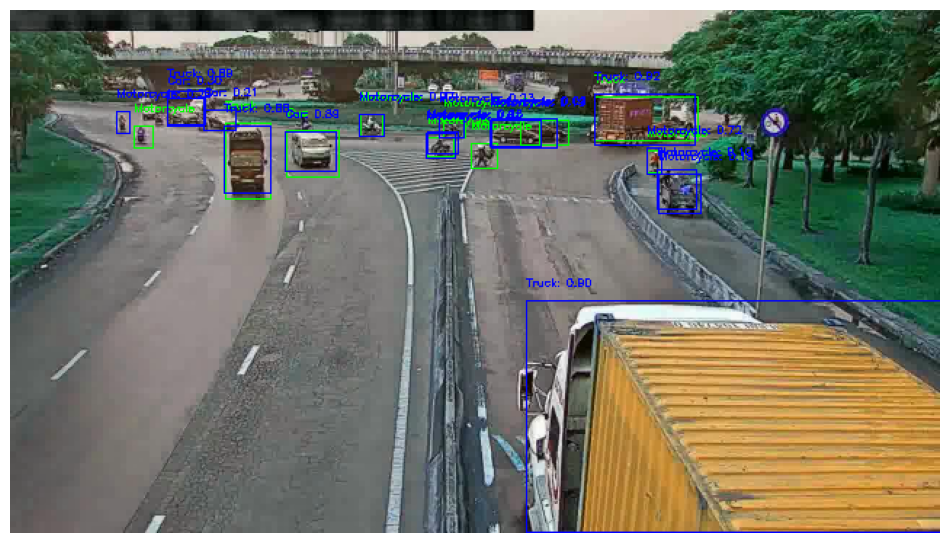

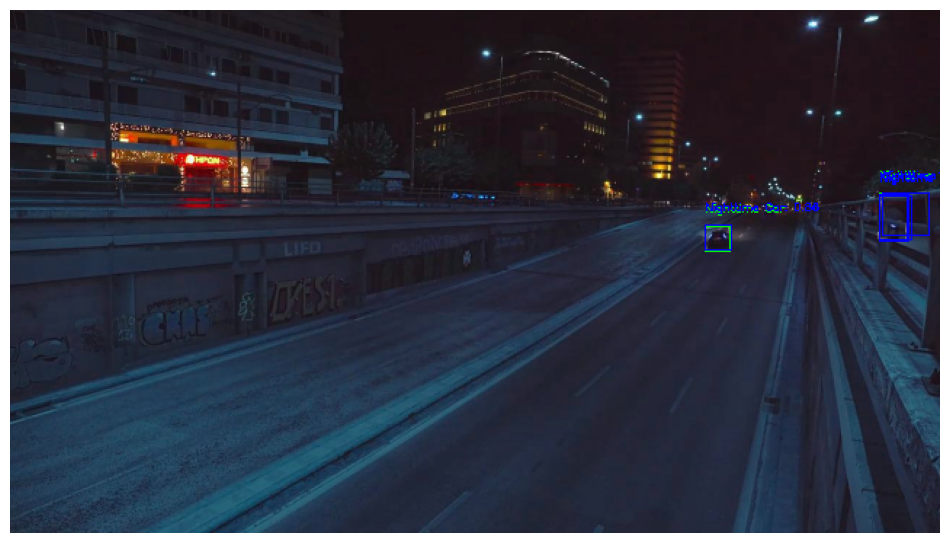

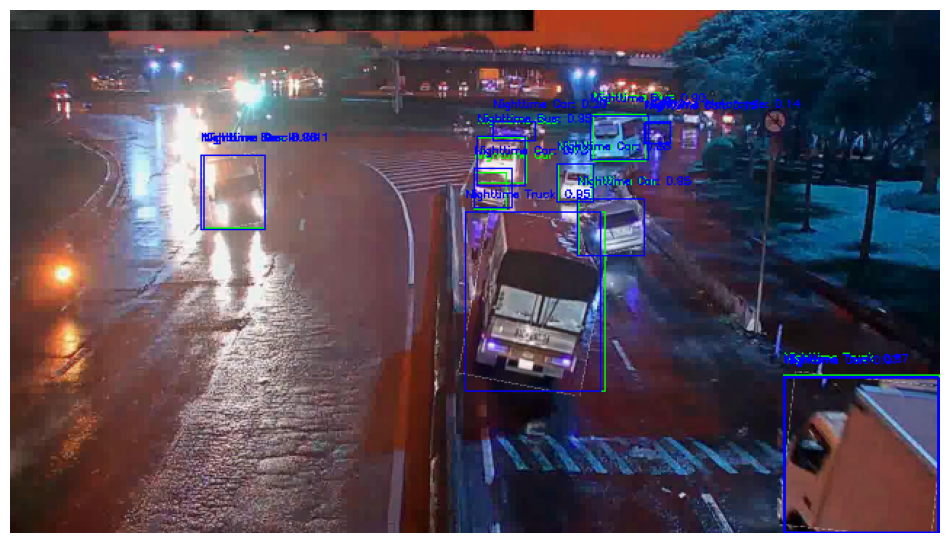

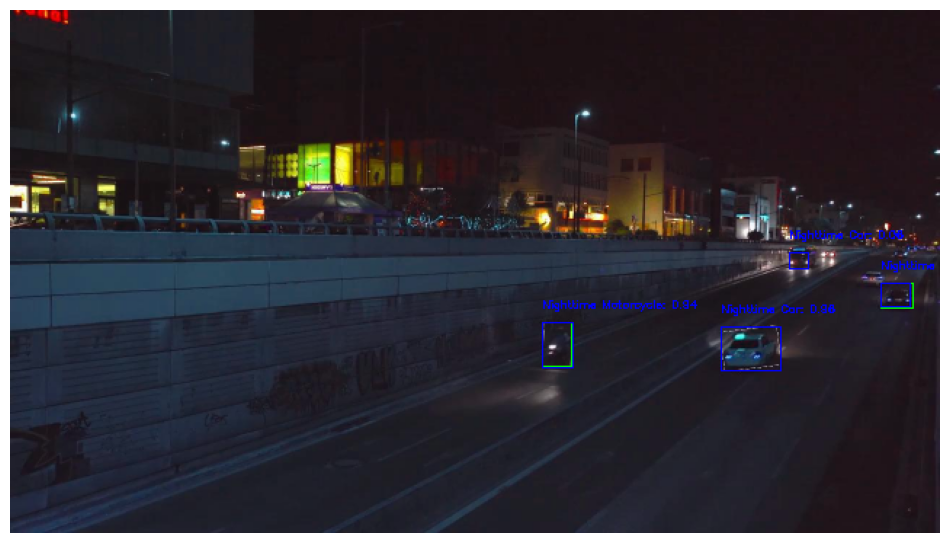

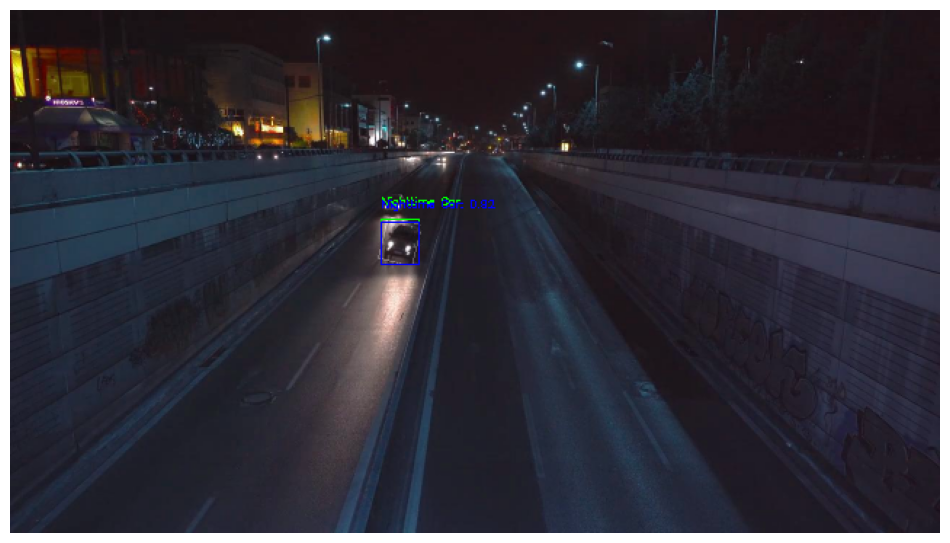

...

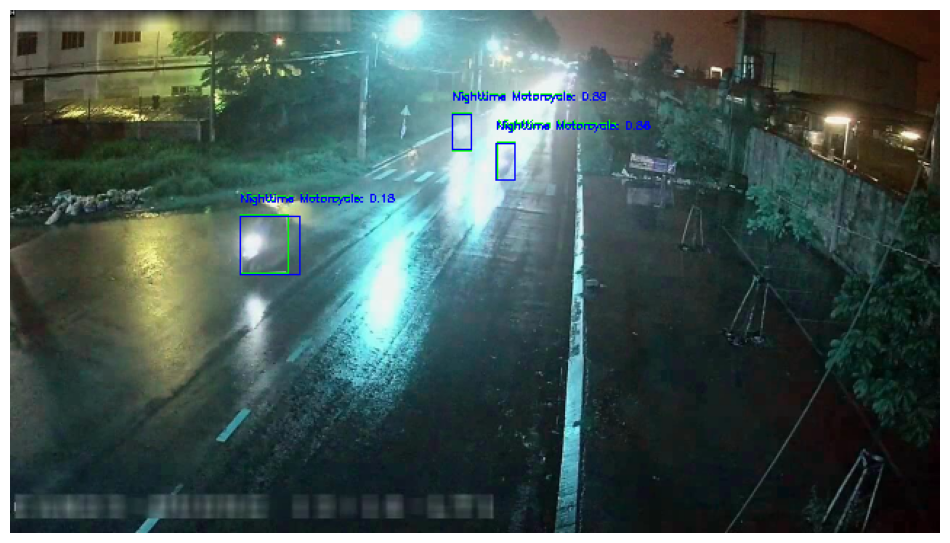

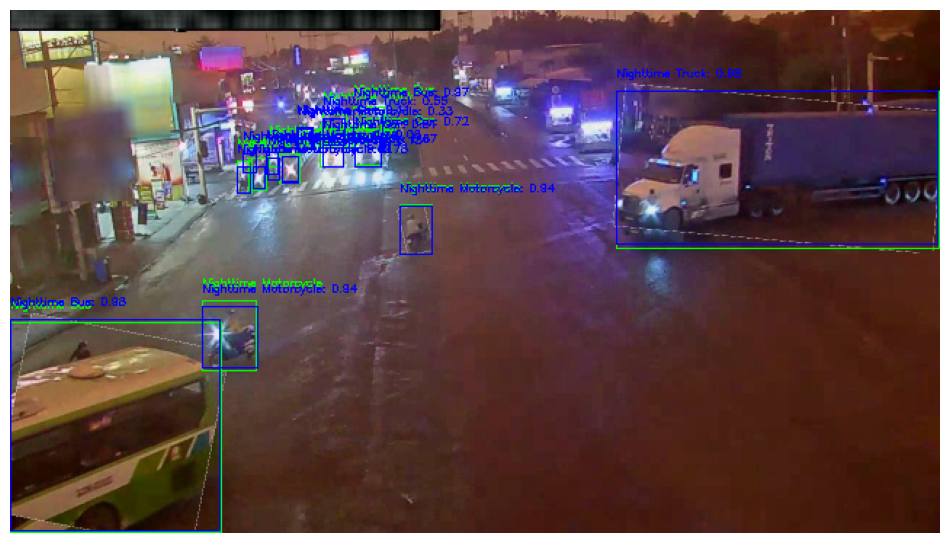

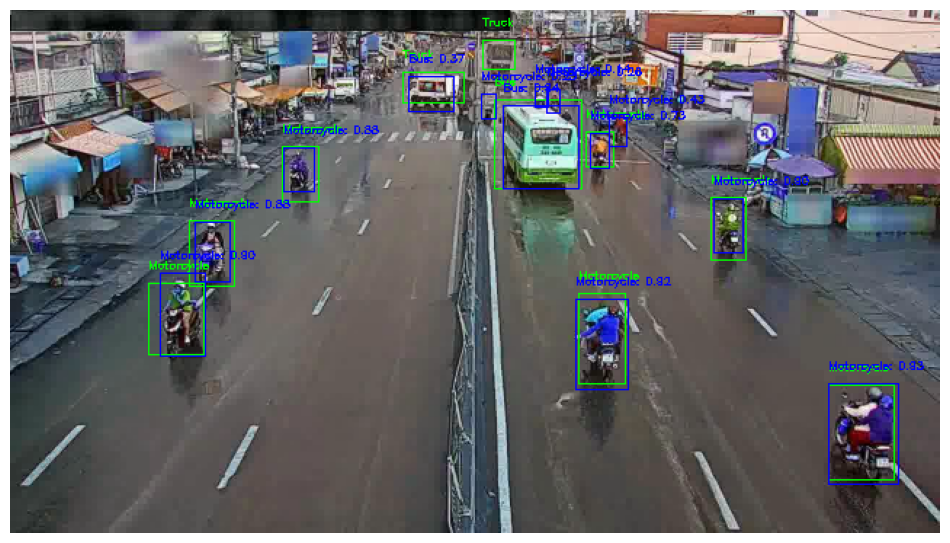

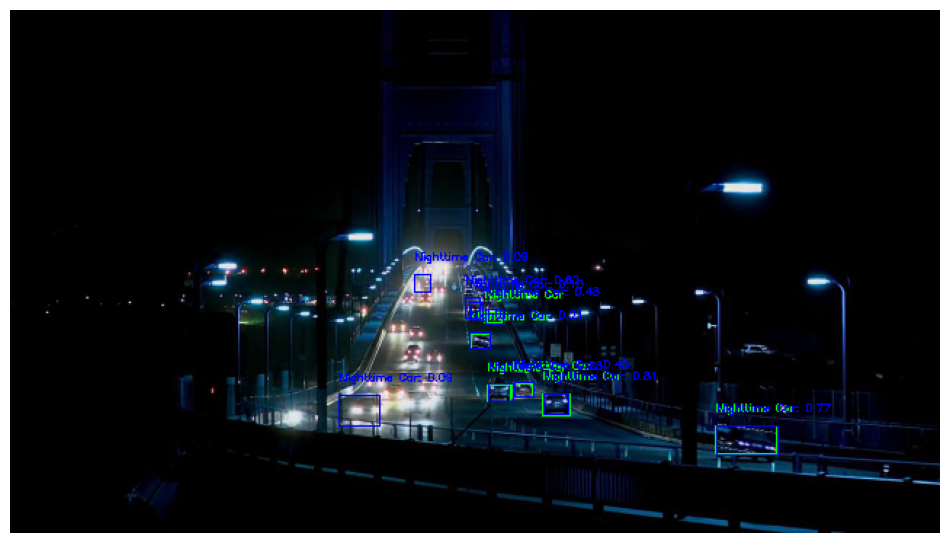

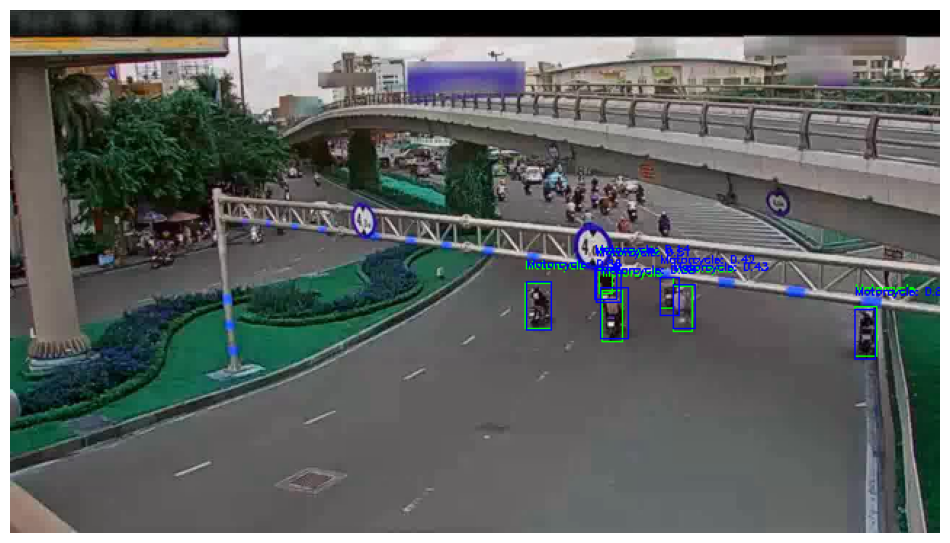

In [161]:
batch = next(iter(test_loader))
inference_and_display(saved['model'].cuda(), batch, show_gt=True, confidence_threshold=0.05)